In [1]:
from veldis.veldis import Veldis
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm
from scipy.optimize import curve_fit
from specim.specfuncs import spec1d

In [2]:
spec = Veldis('../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits', 
              informat='fits', logwav=True, trimsec=[4300, 16000])


Reading spectrum from ../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits
Expected file format: fits
 Spectrum Start:  5353.84
 Spectrum End:     8350.24
 Dispersion (1st pixel):   0.20
 Dispersion (average):      0.26




Line        lambda_rest  lambda_obs
----------  -----------  -----------
H-eta         3835.00       5399.68
CN bandhd     3883.00       5467.26
CaII K        3933.67       5538.61
CaII H        3968.47       5587.61
H-delta       4101.00       5774.21
G-band        4305.00       6061.44
H-gamma       4340.00       6110.72
Fe4383        4383.00       6171.26
Ca4455        4455.00       6272.64
Fe4531        4531.00       6379.65
H-beta        4861.00       6844.29
Mg I (b)      5176.00       7287.81
Na I (D)      5889.95       8293.05
Na I (D)      5895.92       8301.46



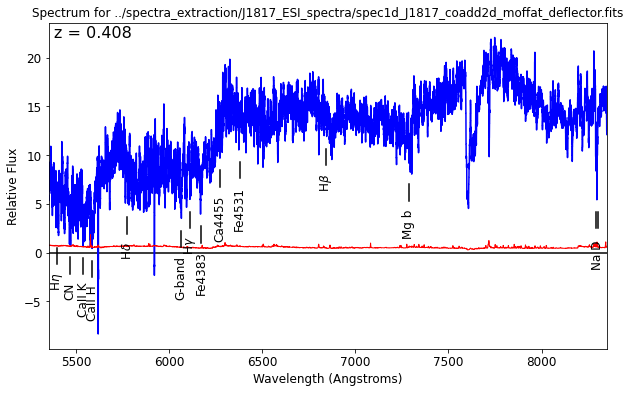

In [3]:
#%matplotlib notebook
fg = plt.figure(figsize=(10,6))
spec.smooth(11, fig=fg)
spec.mark_lines('abs', z=0.408, usesmooth=True)
#spec.mark_lines('em', z=0.407, usesmooth=True)


The wavelength is red shifted.
Velocity scale = 11.389911 km/s


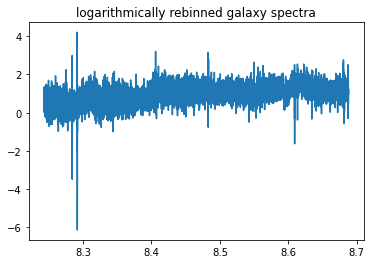

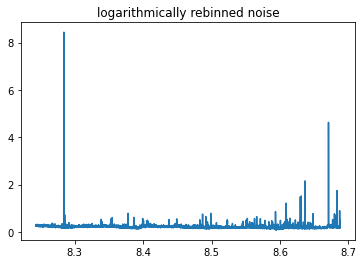

In [4]:
spec.cal_parm(z=0.408, high_z=True, logscale=True, veldis_start=350, noise_scale=0.2)

In [5]:
temp_spec = spec.gen_rebinned_temp(lib_path='../TEXT/*', temp_num=500, sig_ins=2.3)# temp_num=500,


'sig_ins' is red shifted.

As no 'fwhm_temp' value is provided, FWHM for the Indo-US template library will be used as default value
vsyst = -27860.141136 

sigma_diff : 3.824087


In [6]:
mask_reg = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5646, 5769), (5916, 5930),
                             (6076, 6091), (6286, 6341), (6801, 6809), (7585, 7785),  
                             (7957, 7968), (8191, 8214), (8278, 8286)])/1.408)
print(mask_reg)

[[8.25568084 8.25752416]
 [8.28351853 8.2847738 ]
 [8.2908485  8.29280597]
 [8.29653235 8.31808378]
 [8.34324557 8.34560923]
 [8.36993161 8.37239729]
 [8.40390996 8.41262151]
 [8.48265468 8.48383029]
 [8.59175763 8.61778383]
 [8.63963707 8.64101854]
 [8.66862101 8.67142504]
 [8.67918641 8.68015236]]



degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    301237      1000
chi2/DOF: 3.128; degree = 10; mdegree = 0
method = capfit; Jac calls: 11; Func calls: 35; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 500

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    300952      1000
chi2/DOF: 3.128; degree = 11; mdegree = 0
method = capfit; Jac calls: 9; Func calls: 29; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 500

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:    301449      1000
chi2/DOF: 3.120; degree = 12; mdegree = 0
method = capfit; Jac calls: 10; Func calls: 32; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 500

degree : 13
 Best Fit:       Vel     sigma
 comp.  0:    301791      1000
chi2/DOF: 3.114; degree = 13; mdegree = 0
method = capfit; Jac calls: 10; Func calls: 32; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 500

degree : 14
 Best Fit:       Vel     sigma
 comp.  0

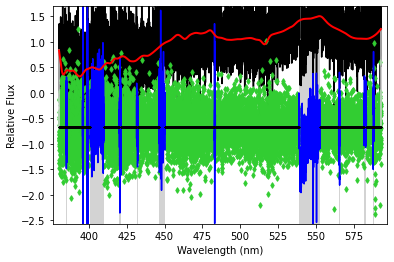

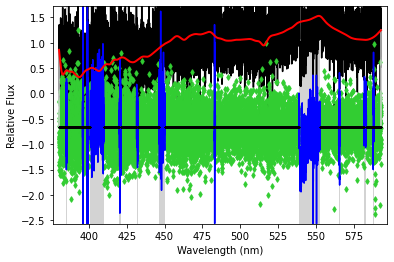

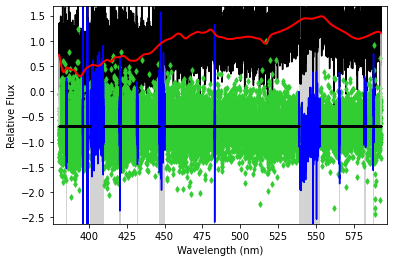

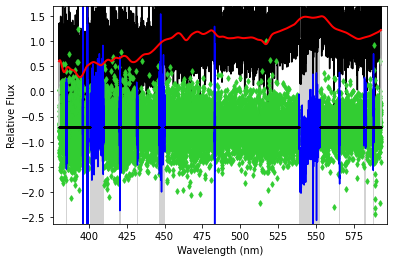

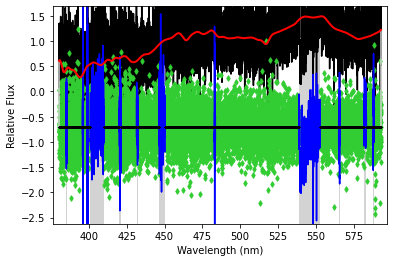

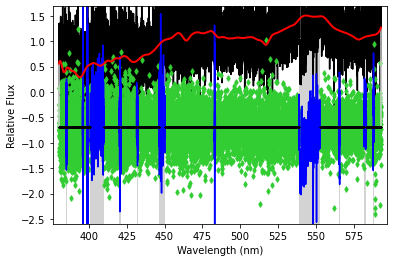

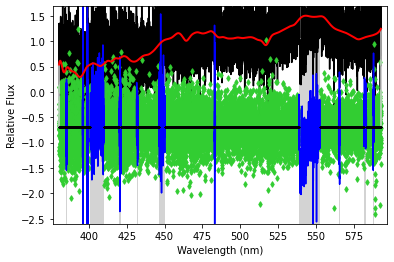

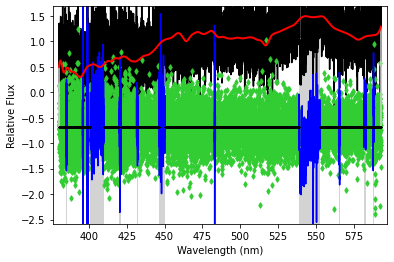

<Figure size 432x288 with 0 Axes>

In [7]:
spec.cal_veldis(temp_spec=temp_spec, degree=[10, 18], mask_reg=mask_reg, show_weight=True, moments=2)

In [4]:
spec.closest_wavelength(wavrange=[[5350, 8510]])


Given waverange(assumed) : 

5350 8510

Closest waverange to the given ones : 

5349.978047635846 8510.05760786796


([(5349.978047635846, 8510.05760786796)], [(4281, 16498)])

## Without red shifting

In [4]:
spec1 = Veldis('../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits', 
              informat='fits', logwav=True, trimsec=[4300, 16000])


Reading spectrum from ../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits
Expected file format: fits
 Spectrum Start:  5353.84
 Spectrum End:     8350.24
 Dispersion (1st pixel):   0.20
 Dispersion (average):      0.26



Velocity scale = 11.389911 km/s


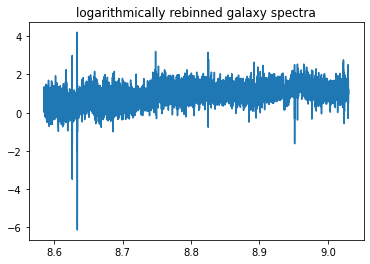

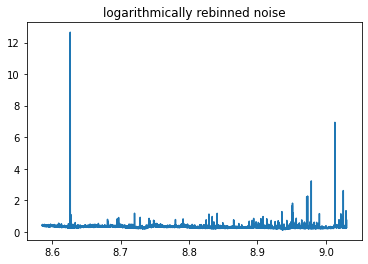

In [5]:
spec1.cal_parm(z=0.408, high_z=False, logscale=True, veldis_start=200, noise_scale=.3)

In [6]:
temp_sp = spec1d.Spec1d('../TEXT/100006.txt')
spec1.gen_sigma_diff(wav_temp=temp_sp['wav'], sig_ins=0.85)


Reading spectrum from ../TEXT/100006.txt
Expected file format: text
 Spectrum Start:  3465.00
 Spectrum End:     9469.00
 Dispersion (1st pixel):   0.40
 Dispersion (average):      0.40


As no 'fwhm_temp' value is provided, FWHM for the Indo-US template library will be used as default value
vsyst = -130440.203758 

sigma_diff : 1.569009


1.5690089689323143

In [7]:
tm_data=np.loadtxt('logrebinned_template_array_for_esi_sig_ins.txt')

In [8]:
mask_reg1 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930), (6076, 6091), 
                             (6235, 6355), (6801, 6809), 
                             (7306, 7334), (7585, 7785),  
                             (7957, 7968), (8191, 8214), (8278, 8286)]))
print(mask_reg1)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.71210186 8.71456755]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]
 [8.89645121 8.90027635]
 [8.93392789 8.95995408]
 [8.98180732 8.9831888 ]
 [9.01079127 9.01359529]
 [9.02135667 9.02232262]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102614       352
chi2/DOF: 1.375; degree = 8; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  16 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102614       349
chi2/DOF: 1.375; degree = 9; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  15 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102606       313
chi2/DOF: 1.373; degree = 10; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  14 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102606       319
chi2/DOF: 1.373; degree = 11; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  14 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:  

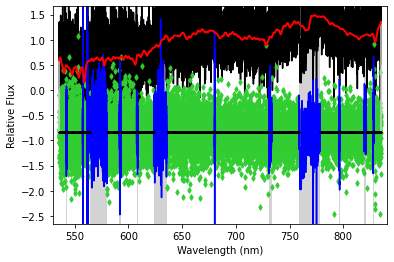

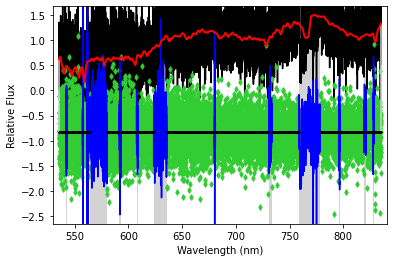

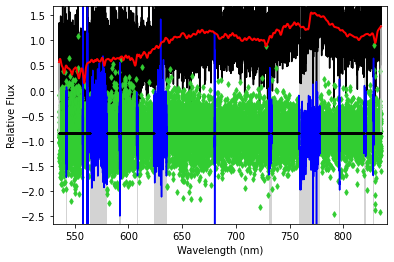

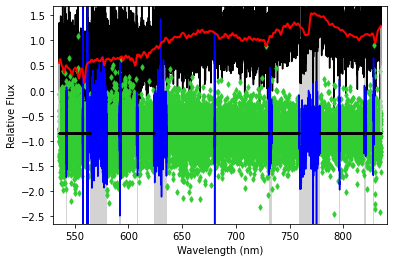

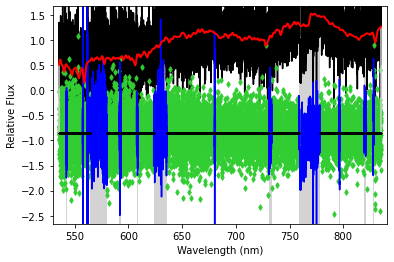

...

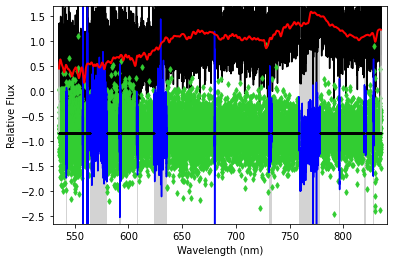

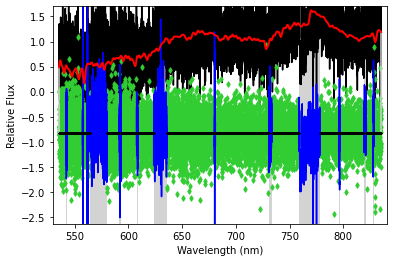

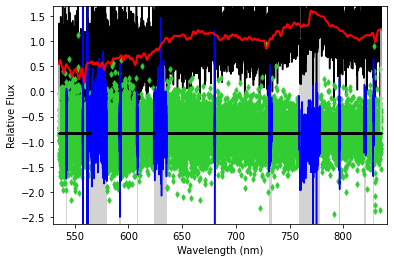

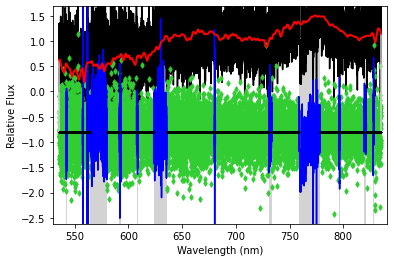

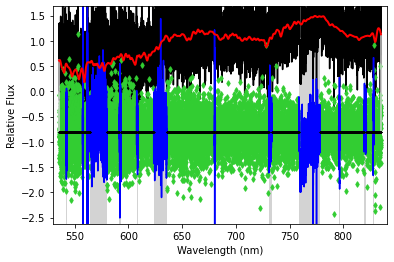

<Figure size 432x288 with 0 Axes>

In [9]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg1, show_weight=True, moments=2)

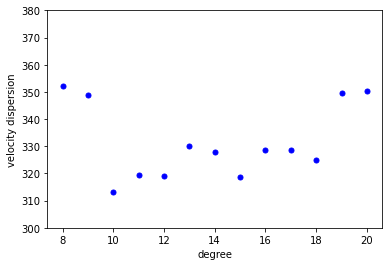

In [10]:
spec1.plot_veldis(ylim=[300, 380])

order : 10


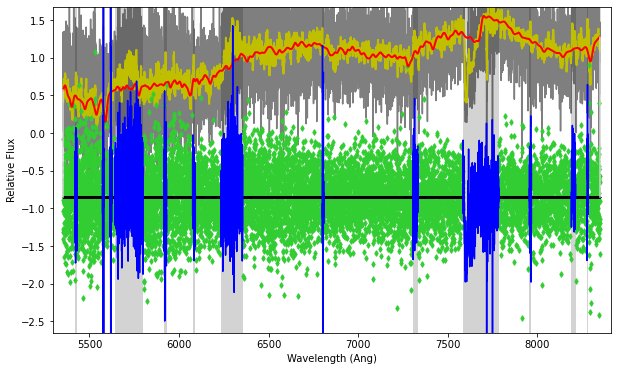

order : 12


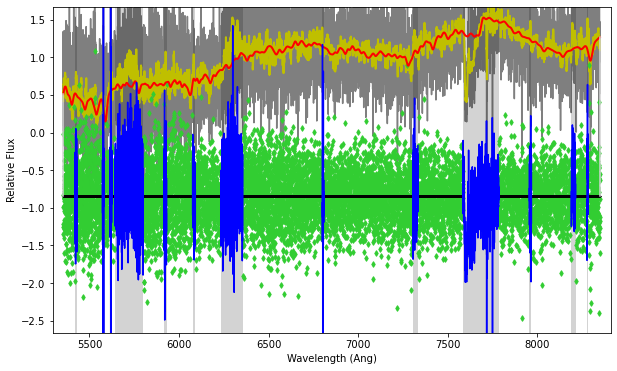

order : 14


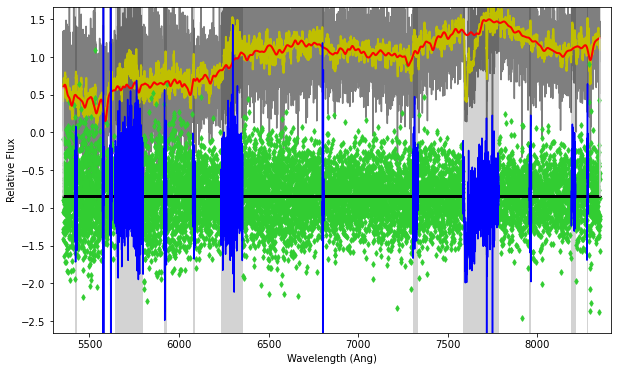

order : 18


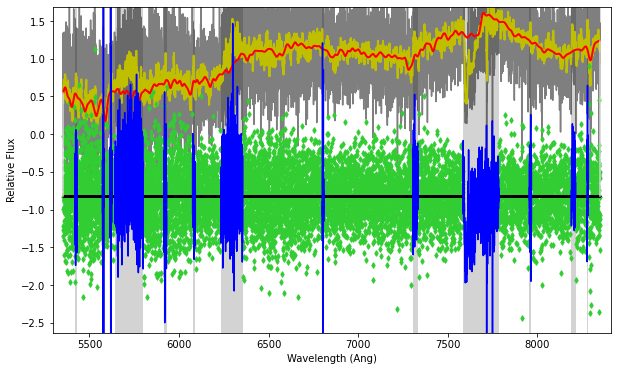

In [11]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [12]:
mask_reg2 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930), 
                             (6235, 6355), (6801, 6809), 
                             (7306, 7334), (7585, 7785),  
                             (7957, 7968), (8191, 8214), (8278, 8286)]))
print(mask_reg2)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]
 [8.89645121 8.90027635]
 [8.93392789 8.95995408]
 [8.98180732 8.9831888 ]
 [9.01079127 9.01359529]
 [9.02135667 9.02232262]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102589       281
chi2/DOF: 1.379; degree = 8; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  14 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102593       293
chi2/DOF: 1.378; degree = 9; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  13 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102588       256
chi2/DOF: 1.376; degree = 10; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102587       258
chi2/DOF: 1.376; degree = 11; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:    1

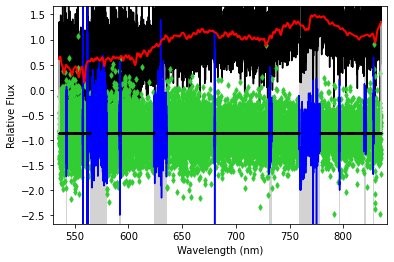

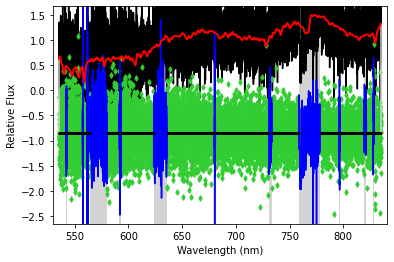

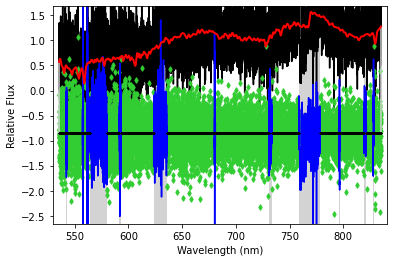

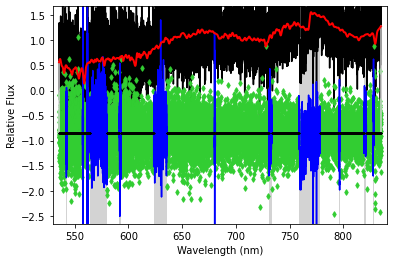

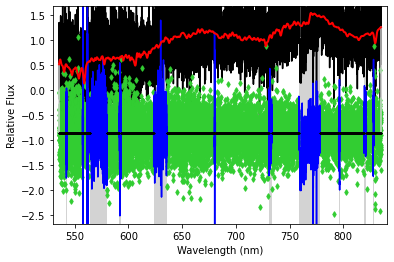

...

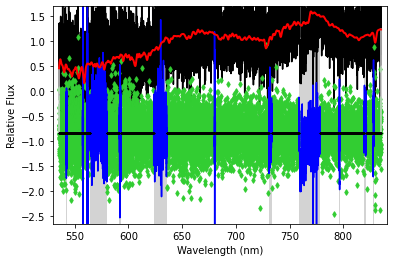

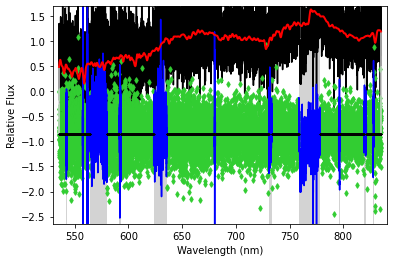

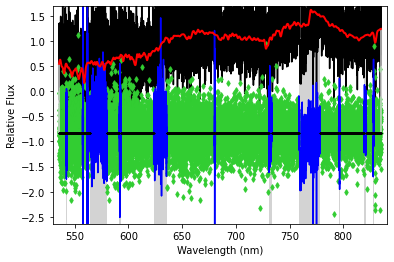

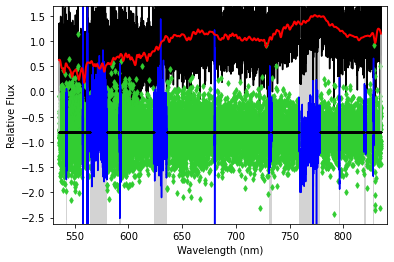

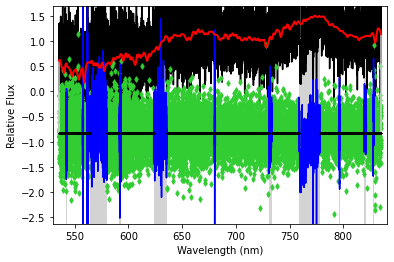

<Figure size 432x288 with 0 Axes>

In [13]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg2, show_weight=True, moments=2)

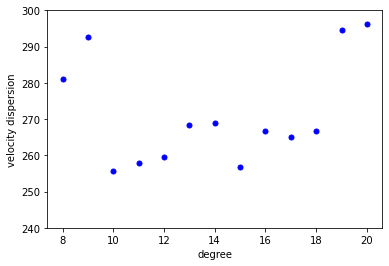

In [14]:
spec1.plot_veldis(ylim=[240, 300])

order : 10


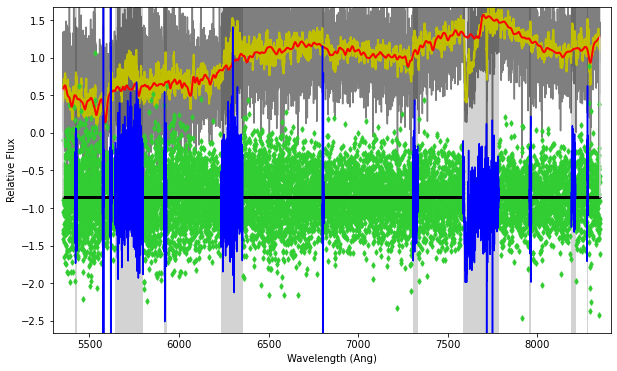

order : 12


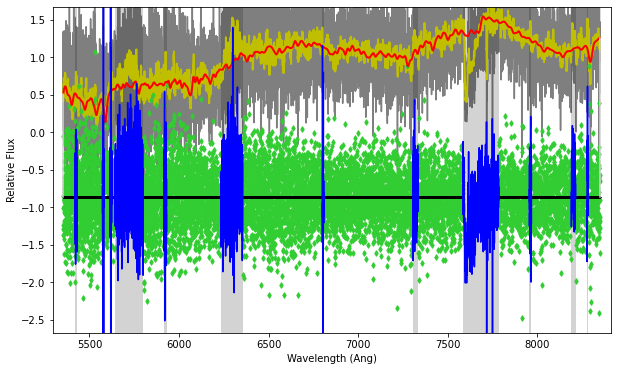

order : 14


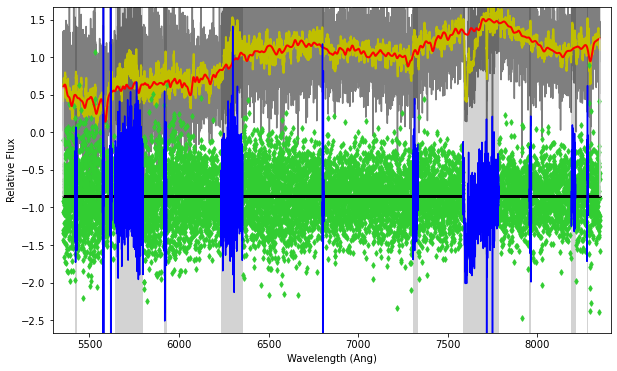

order : 18


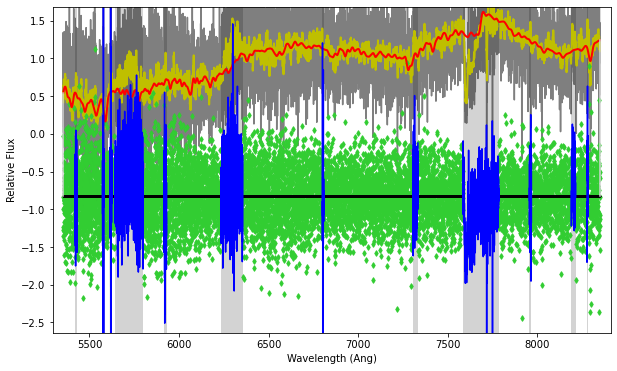

In [15]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [16]:
mask_reg3 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930), 
                             (6235, 6355), (6801, 6809), 
                             (7585, 7785),  
                             (7957, 7968), (8191, 8214), (8278, 8286)]))
print(mask_reg3)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]
 [8.93392789 8.95995408]
 [8.98180732 8.9831888 ]
 [9.01079127 9.01359529]
 [9.02135667 9.02232262]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102584       271
chi2/DOF: 1.381; degree = 8; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  17 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102585       271
chi2/DOF: 1.380; degree = 9; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  13 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102583       250
chi2/DOF: 1.378; degree = 10; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102582       253
chi2/DOF: 1.378; degree = 11; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:    10

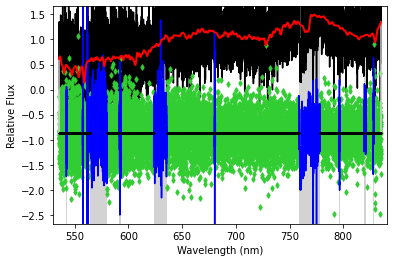

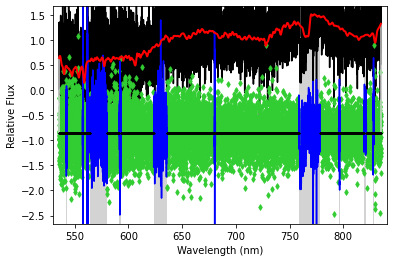

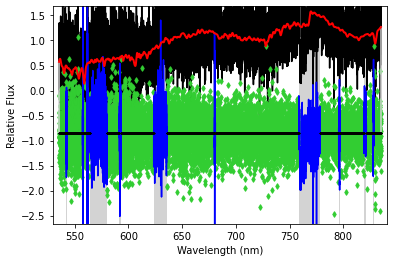

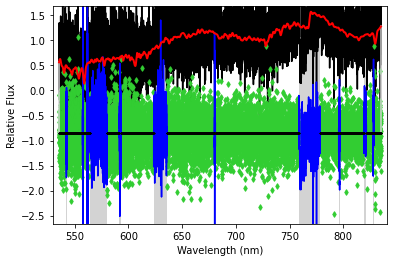

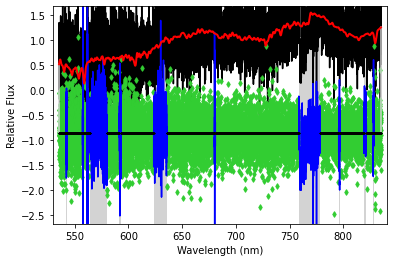

...

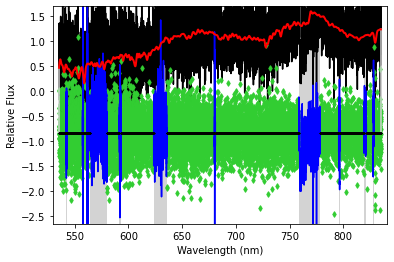

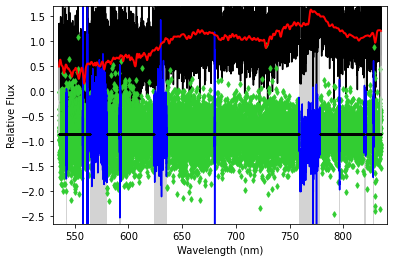

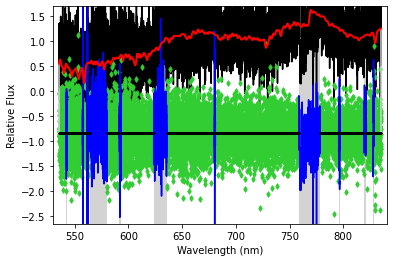

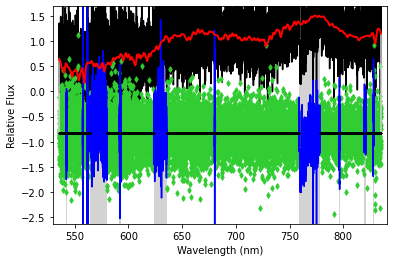

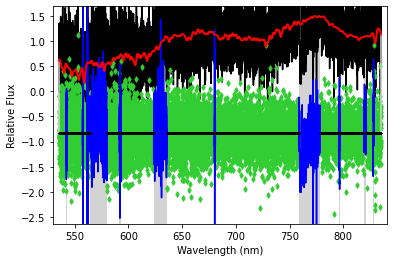

<Figure size 432x288 with 0 Axes>

In [17]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg3, show_weight=True, moments=2)

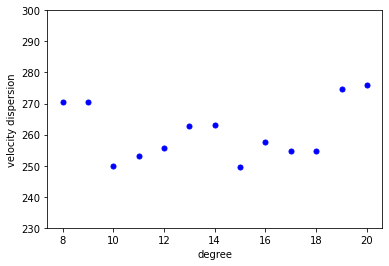

In [18]:
spec1.plot_veldis(ylim=[230, 300])

order : 10


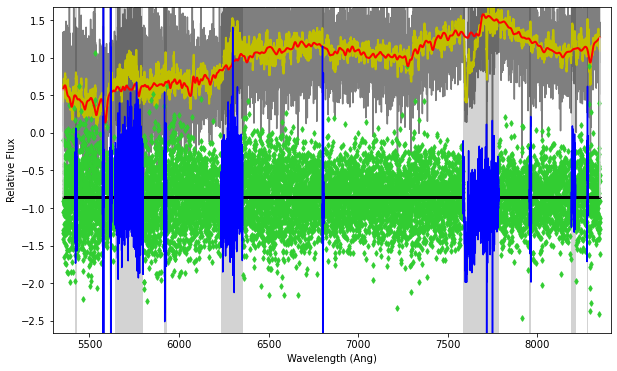

order : 12


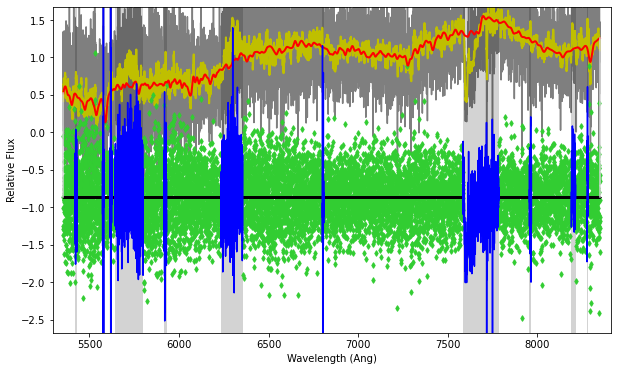

order : 14


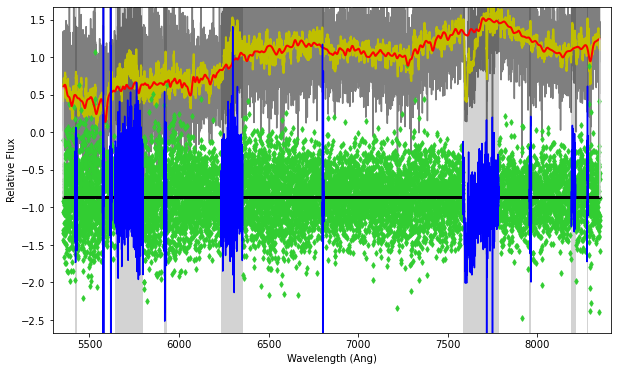

order : 18


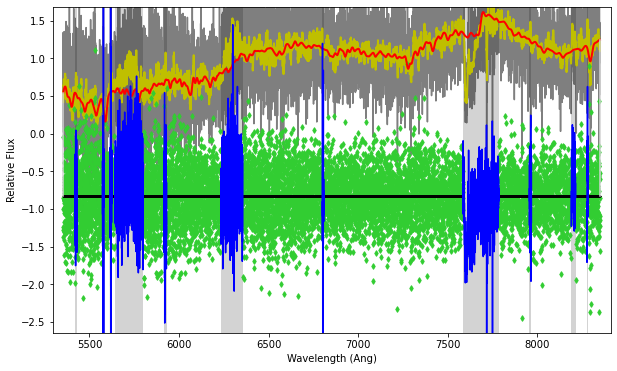

In [19]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [20]:
mask_reg4 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (6235, 6355), (6801, 6809), 
                             (7585, 7785)]))
print(mask_reg4)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]
 [8.93392789 8.95995408]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102589       277
chi2/DOF: 1.392; degree = 8; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  17 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102591       276
chi2/DOF: 1.391; degree = 9; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  13 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102590       252
chi2/DOF: 1.388; degree = 10; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102589       255
chi2/DOF: 1.388; degree = 11; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:    10

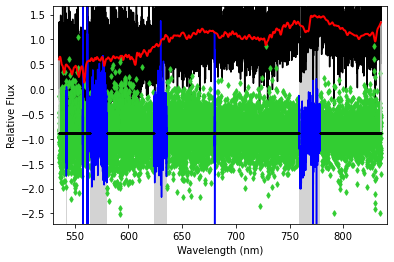

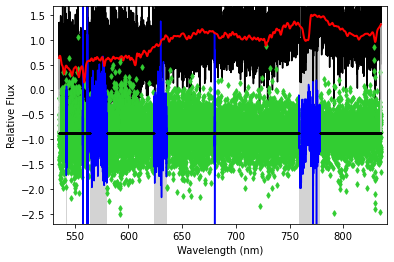

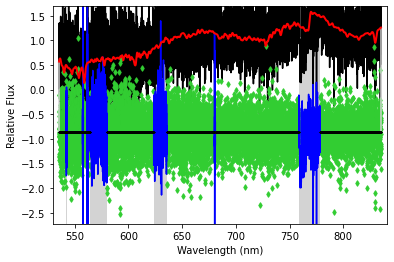

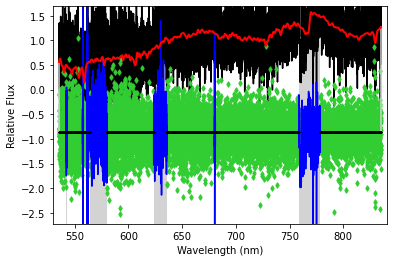

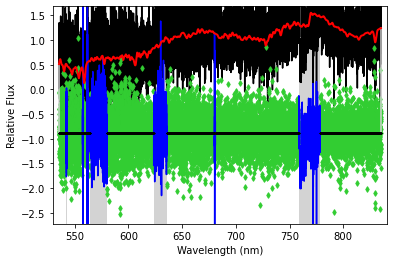

...

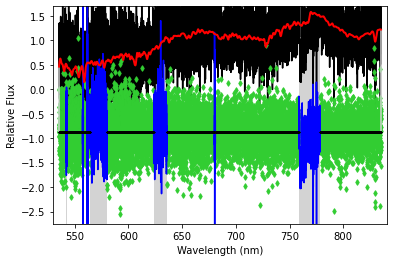

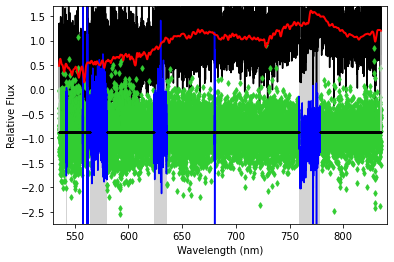

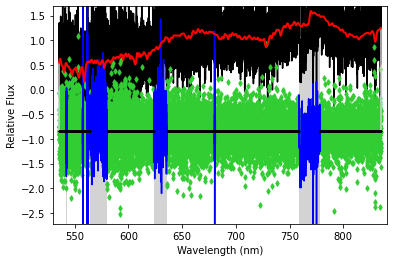

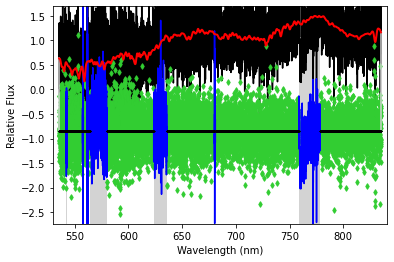

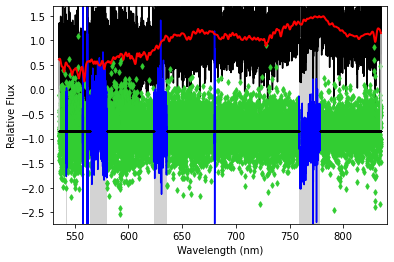

<Figure size 432x288 with 0 Axes>

In [21]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg4, show_weight=True, moments=2)

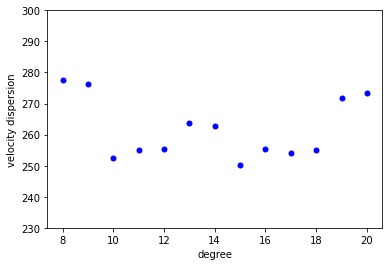

In [22]:
spec1.plot_veldis(ylim=[230, 300])

order : 10


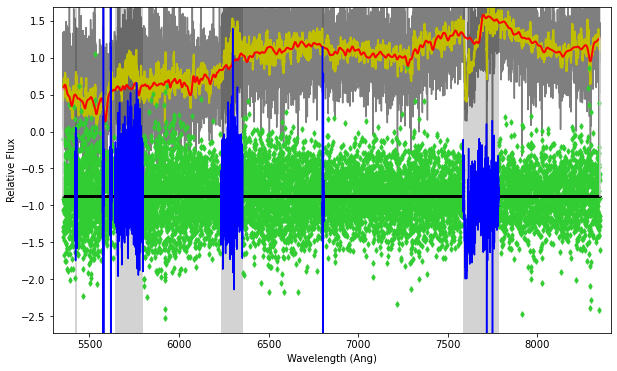

order : 12


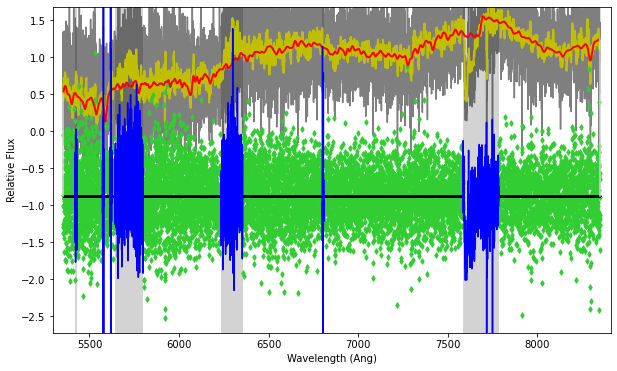

order : 14


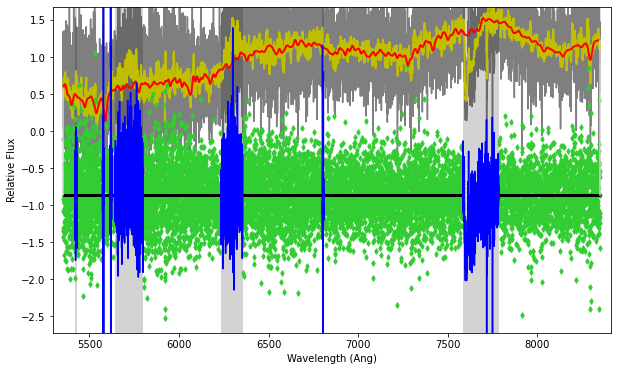

order : 18


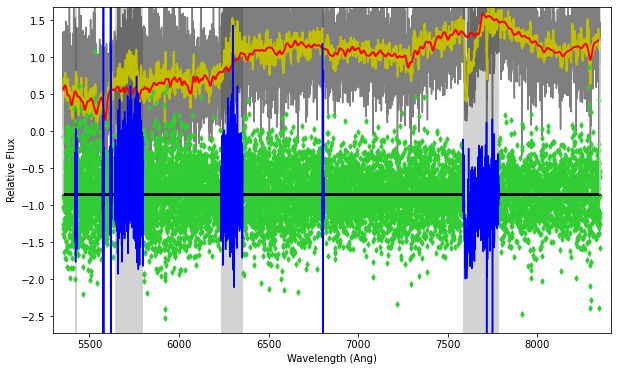

In [23]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [24]:
mask_reg5 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625),
                             (6235, 6355), (6801, 6809), 
                             (7585, 7785)]))
print(mask_reg5)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]
 [8.93392789 8.95995408]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102627       319
chi2/DOF: 1.407; degree = 8; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  19 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102630       313
chi2/DOF: 1.406; degree = 9; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  14 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102620       284
chi2/DOF: 1.404; degree = 10; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  13 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102620       294
chi2/DOF: 1.404; degree = 11; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:  

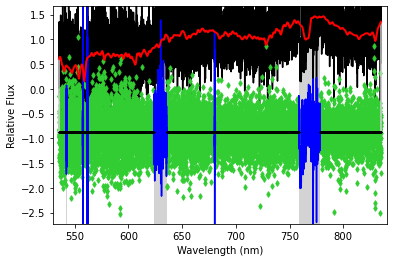

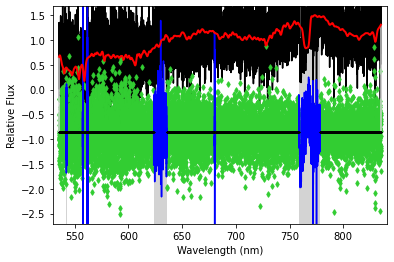

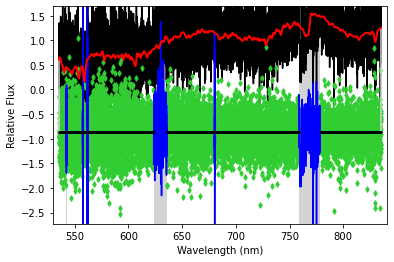

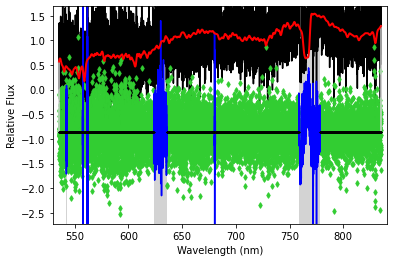

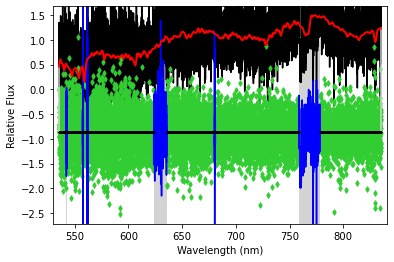

...

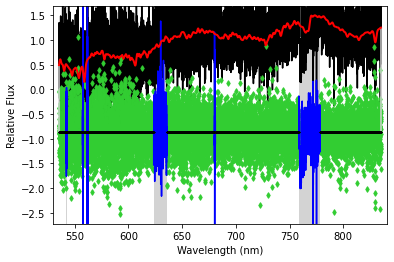

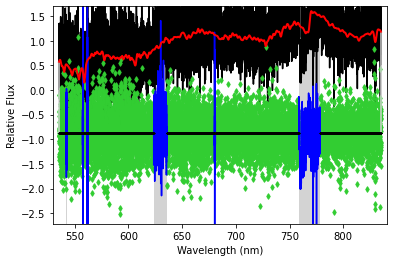

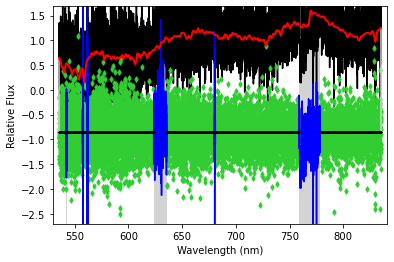

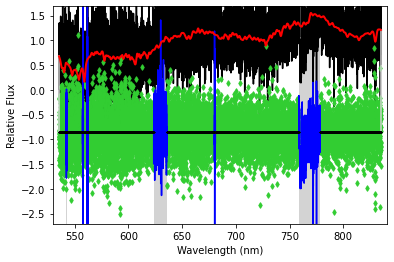

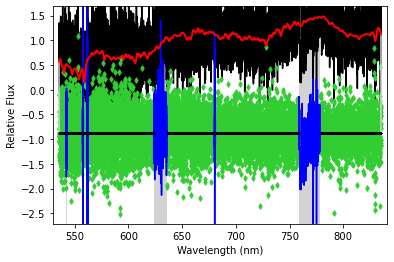

<Figure size 432x288 with 0 Axes>

In [25]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg5, show_weight=True, moments=2)

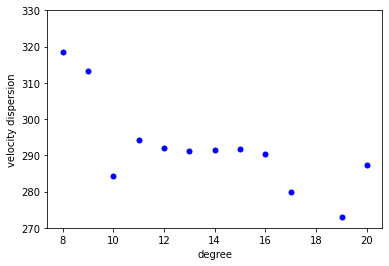

In [26]:
spec1.plot_veldis(ylim=[270, 330])

order : 10


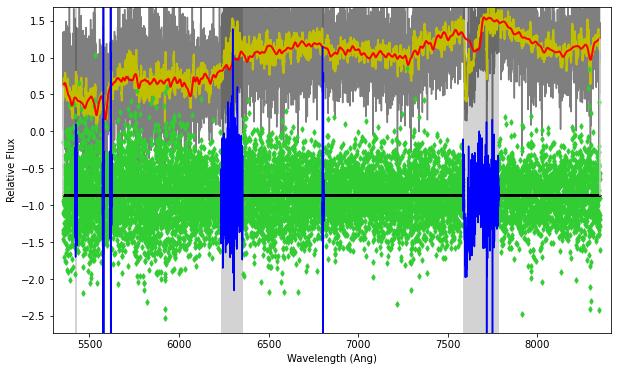

order : 12


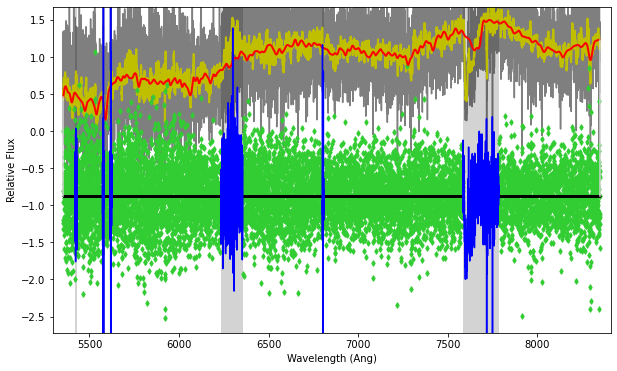

order : 14


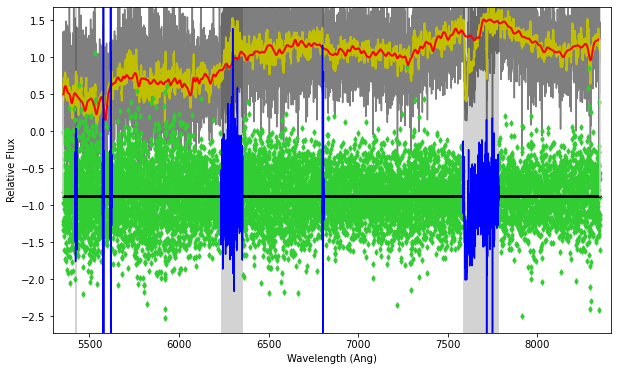

order : 18


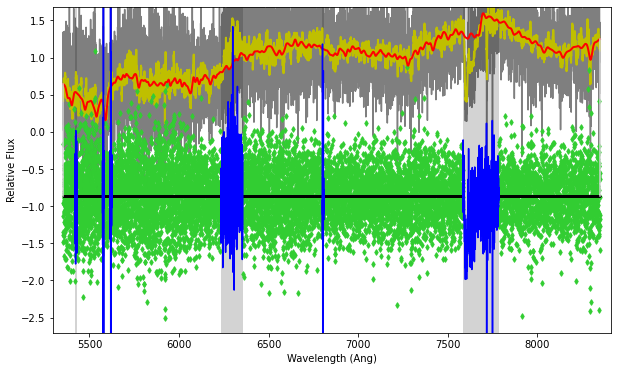

In [27]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [28]:
mask_reg6 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800),
                            (6801, 6809), 
                             (7585, 7785)]))
print(mask_reg6)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.82482494 8.82600055]
 [8.93392789 8.95995408]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102583       273
chi2/DOF: 1.397; degree = 8; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  17 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102586       274
chi2/DOF: 1.396; degree = 9; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  15 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102583       261
chi2/DOF: 1.395; degree = 10; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102583       264
chi2/DOF: 1.395; degree = 11; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:    10

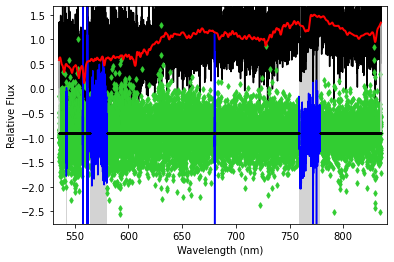

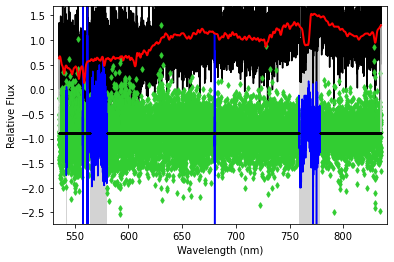

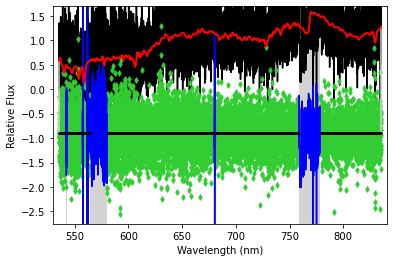

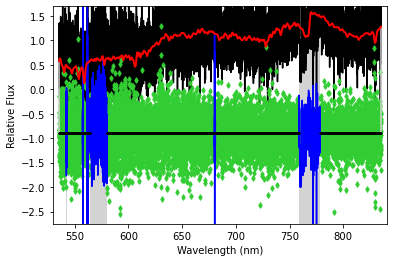

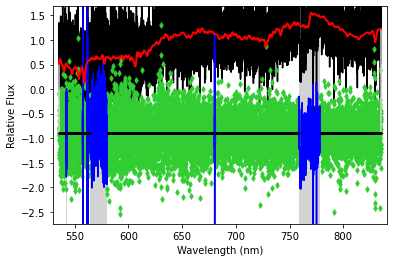

...

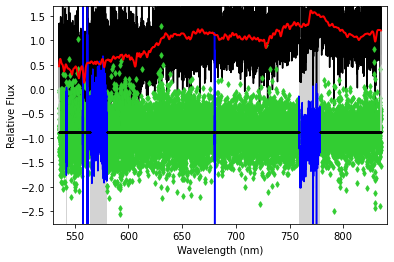

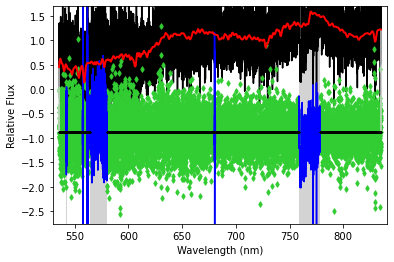

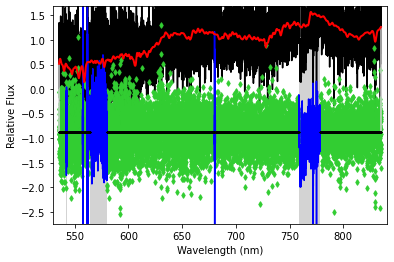

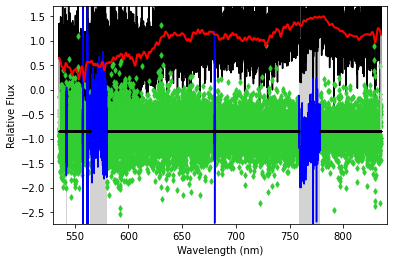

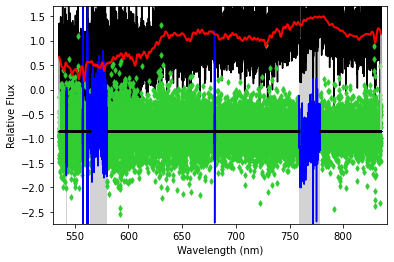

<Figure size 432x288 with 0 Axes>

In [29]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg6, show_weight=True, moments=2)

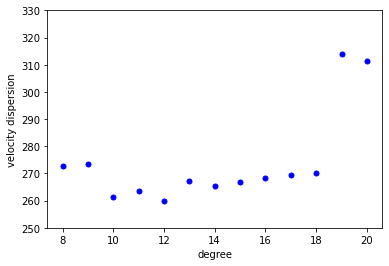

In [30]:
spec1.plot_veldis(ylim=[250, 330])

order : 10


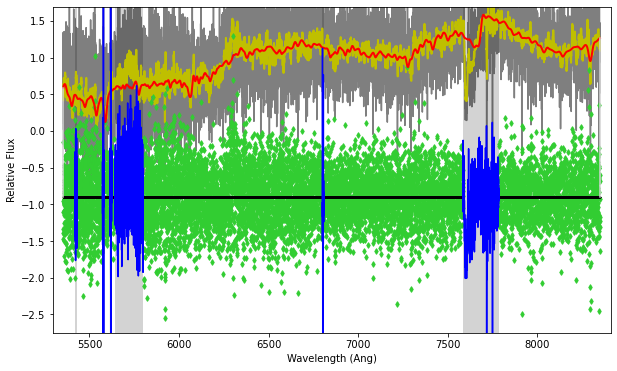

order : 12


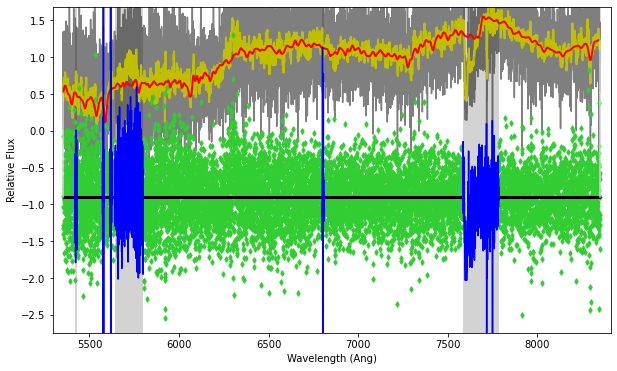

order : 14


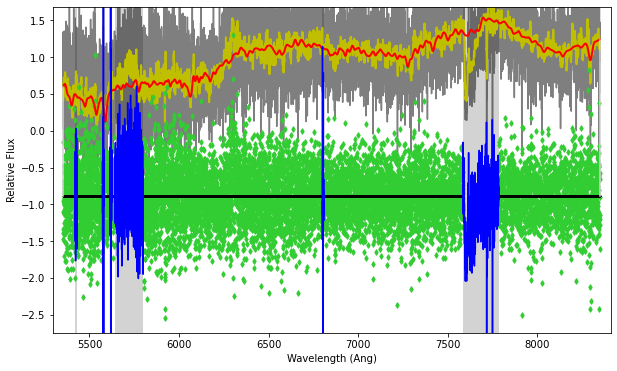

order : 18


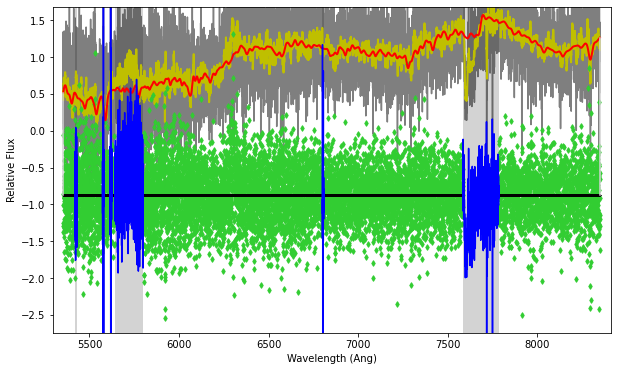

In [31]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [32]:
mask_reg7 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930), 
                             (6801, 6809), 
                             (7585, 7785),  
                             (7957, 7968), (8191, 8214), (8278, 8286)]))
print(mask_reg7)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.82482494 8.82600055]
 [8.93392789 8.95995408]
 [8.98180732 8.9831888 ]
 [9.01079127 9.01359529]
 [9.02135667 9.02232262]]



degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102579       269
chi2/DOF: 1.387; degree = 8; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  16 / 1272

degree : 9
 Best Fit:       Vel     sigma
 comp.  0:    102580       270
chi2/DOF: 1.386; degree = 9; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  13 / 1272

degree : 10
 Best Fit:       Vel     sigma
 comp.  0:    102577       258
chi2/DOF: 1.386; degree = 10; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  13 / 1272

degree : 11
 Best Fit:       Vel     sigma
 comp.  0:    102576       262
chi2/DOF: 1.385; degree = 11; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 12
 Best Fit:       Vel     sigma
 comp.  0:    10

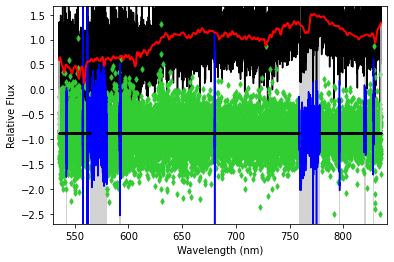

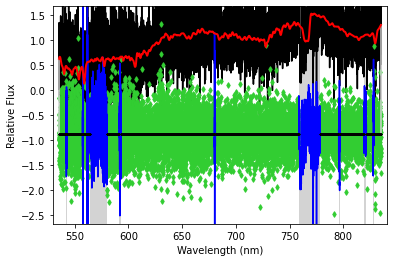

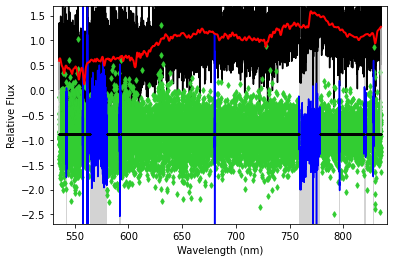

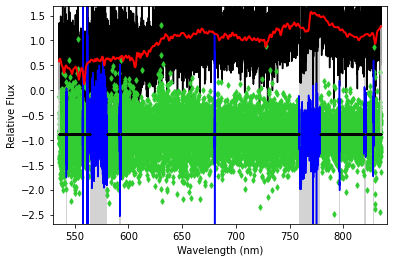

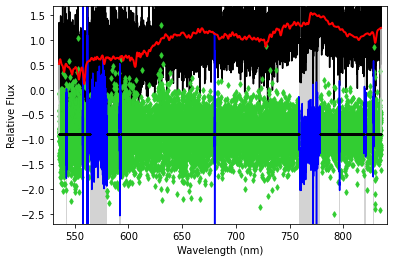

...

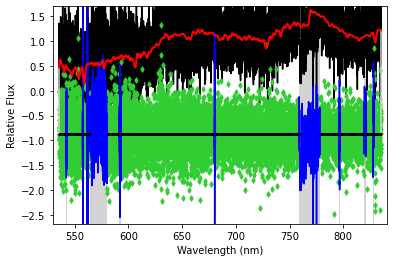

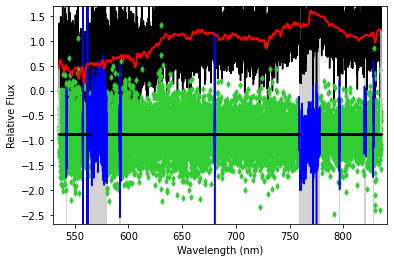

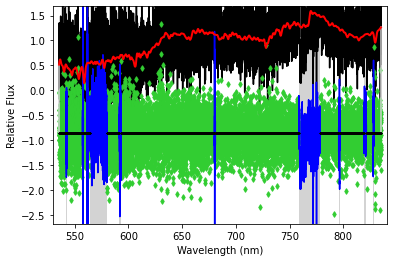

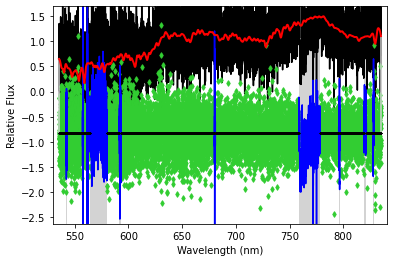

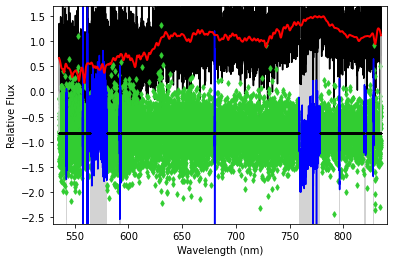

<Figure size 432x288 with 0 Axes>

In [33]:
spec1.cal_veldis(temp_spec=tm_data, degree=[8, 21], mask_reg=mask_reg7, show_weight=True, moments=2)

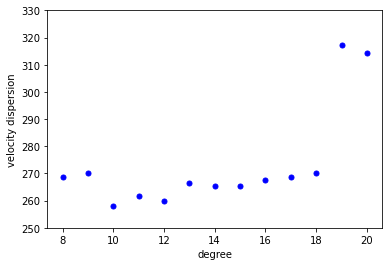

In [34]:
spec1.plot_veldis(ylim=[250, 330])

order : 10


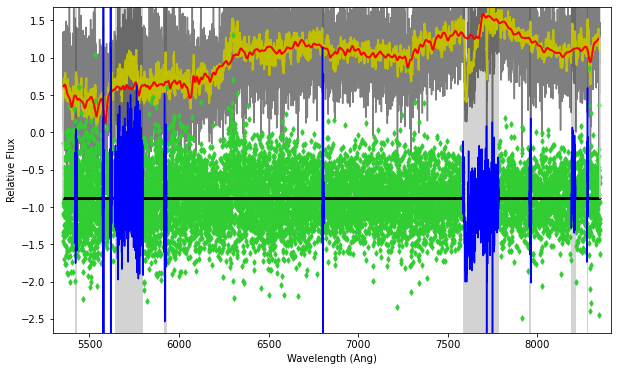

order : 12


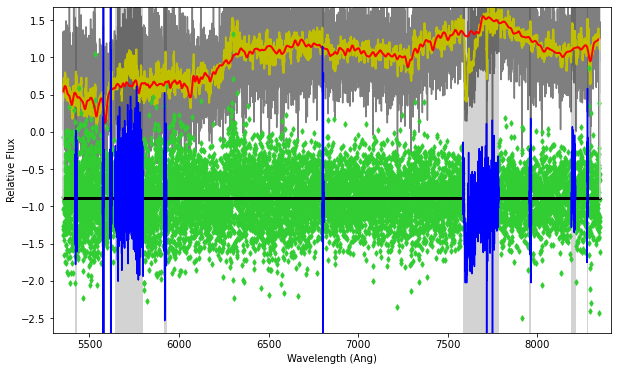

order : 14


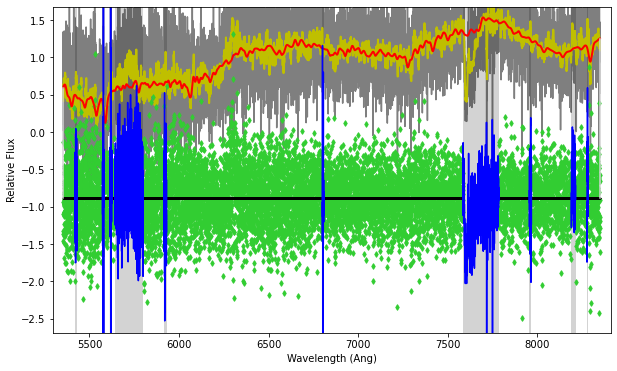

order : 18


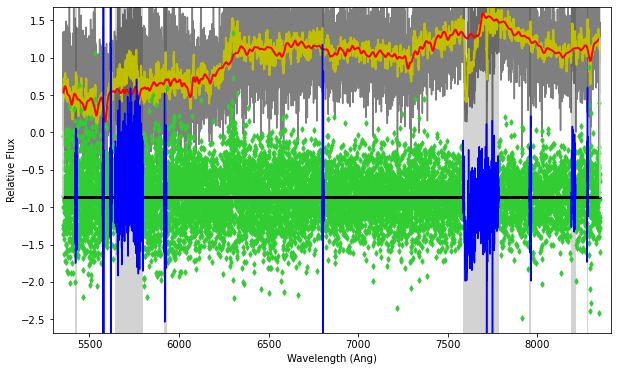

In [35]:
ord_list = np.array([10, 12, 14, 18])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec1.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

# blue side 

In [77]:
spec_b = Veldis('../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits', 
              informat='fits', logwav=True, trimsec=[4300, 10200])


Reading spectrum from ../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits
Expected file format: fits
 Spectrum Start:  5353.84
 Spectrum End:     6698.83
 Dispersion (1st pixel):   0.20
 Dispersion (average):      0.23




Line        lambda_rest  lambda_obs
----------  -----------  -----------
H-eta         3835.00       5399.68
CN bandhd     3883.00       5467.26
CaII K        3933.67       5538.61
CaII H        3968.47       5587.61
H-delta       4101.00       5774.21
G-band        4305.00       6061.44
H-gamma       4340.00       6110.72
Fe4383        4383.00       6171.26
Ca4455        4455.00       6272.64
Fe4531        4531.00       6379.65



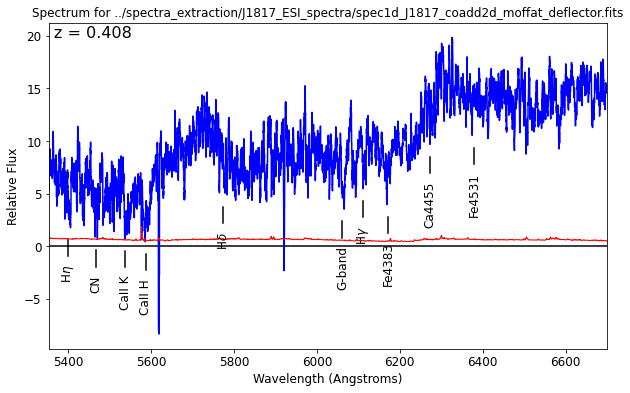

In [78]:
fg = plt.figure(figsize=(10,6))
spec_b.smooth(11, fig=fg)
spec_b.mark_lines('abs', z=0.408, usesmooth=True)

In [23]:
spec_b.closest_wavelength(wavrange=[[5354, 6900]])


Given waverange(assumed) : 

5354 6900

Closest waverange to the given ones : 

5354.0447898045895 6900.054166043088


([(5354.0447898045895, 6900.054166043088)], [(4301, 10978)])

Velocity scale = 11.389911 km/s


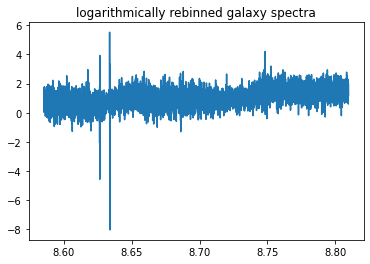

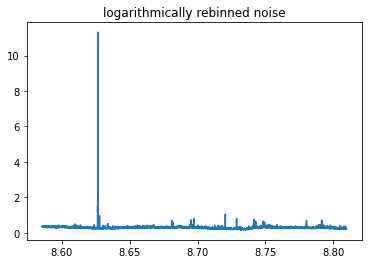

In [79]:
spec_b.cal_parm(z=0.408, high_z=False, logscale=True, veldis_start=300, noise_scale=0.3)

In [80]:
temp_sp = spec1d.Spec1d('../TEXT/100006.txt')
spec_b.gen_sigma_diff(wav_temp=temp_sp['wav'], sig_ins=0.85)


Reading spectrum from ../TEXT/100006.txt
Expected file format: text
 Spectrum Start:  3465.00
 Spectrum End:     9469.00
 Dispersion (1st pixel):   0.40
 Dispersion (average):      0.40


As no 'fwhm_temp' value is provided, FWHM for the Indo-US template library will be used as default value
vsyst = -130440.203758 

sigma_diff : 1.569009


1.5690089689323143

In [81]:
mask_reg_b1 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930), (6076, 6091), 
                             (6235, 6355), (6801, 6809)]))
print(mask_reg_b1)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.71210186 8.71456755]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]]



degree : 4
 Best Fit:       Vel     sigma
 comp.  0:    102591       204
chi2/DOF: 3.048; degree = 4; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 5
 Best Fit:       Vel     sigma
 comp.  0:    102588       174
chi2/DOF: 3.038; degree = 5; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 4
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 6
 Best Fit:       Vel     sigma
 comp.  0:    102574       182
chi2/DOF: 3.035; degree = 6; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 7
 Best Fit:       Vel     sigma
 comp.  0:    102575       184
chi2/DOF: 3.033; degree = 7; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    10258

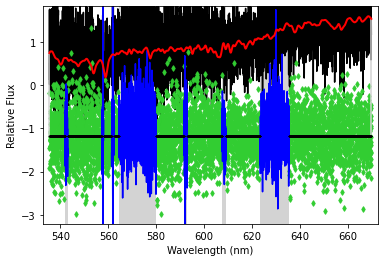

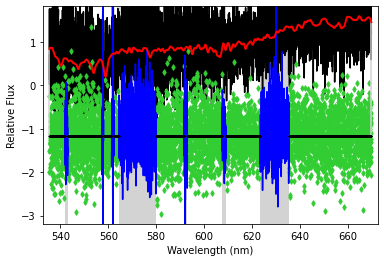

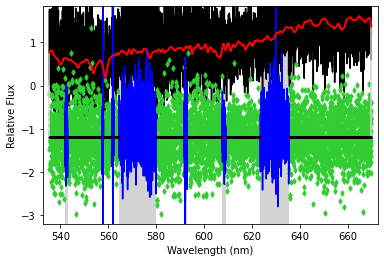

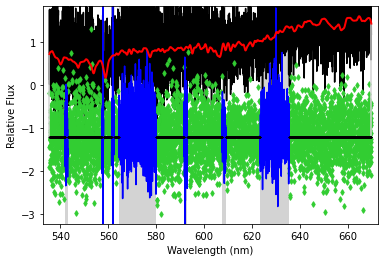

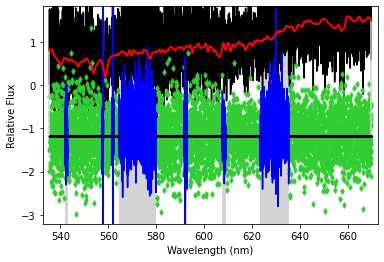

...

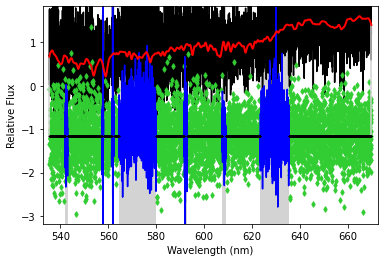

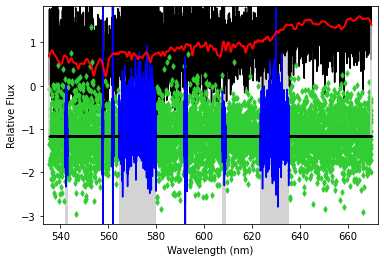

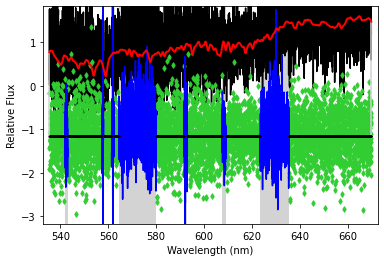

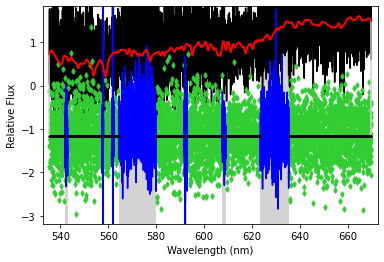

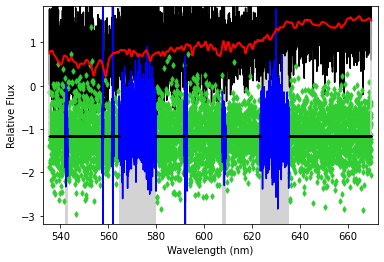

<Figure size 432x288 with 0 Axes>

In [82]:
spec_b.cal_veldis(temp_spec=tm_data, degree=[4, 15], mask_reg=mask_reg_b1, show_weight=True, moments=2)

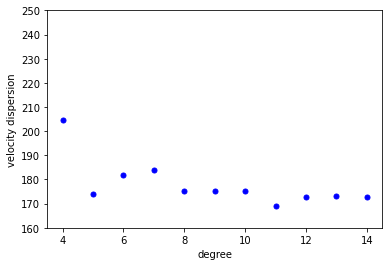

In [83]:
spec_b.plot_veldis(ylim=[160, 250])

order : 5


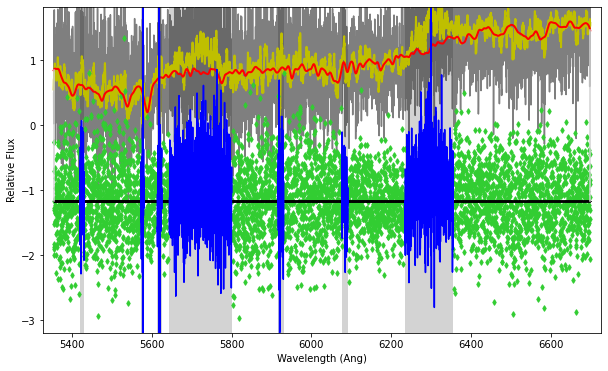

order : 8


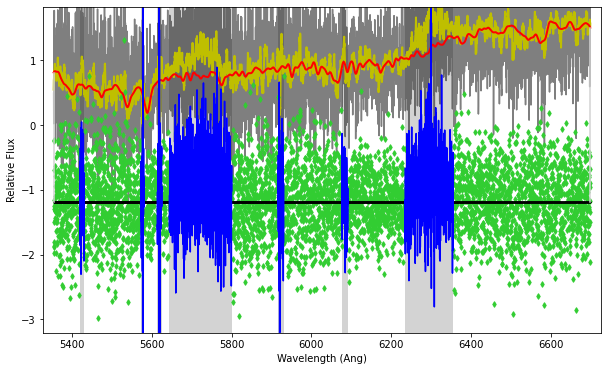

order : 10


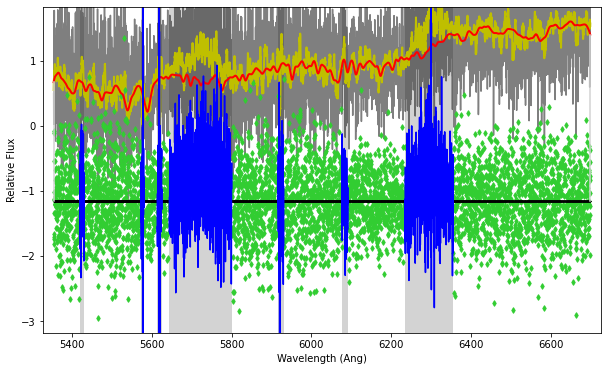

order : 12


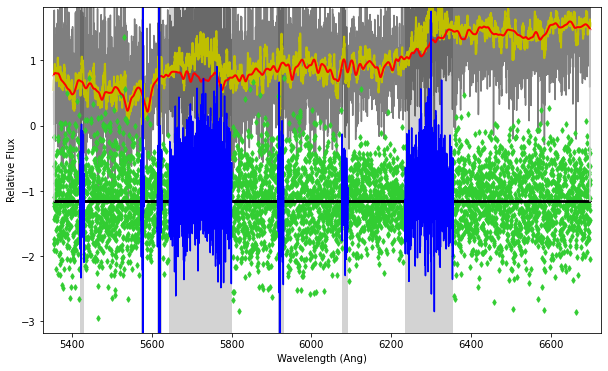

In [84]:
ord_list = np.array([5, 8, 10, 12])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec_b.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [85]:
mask_reg_b2 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930),
                             (6235, 6355), (6801, 6809)]))
print(mask_reg_b2)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.73793386 8.75699718]
 [8.82482494 8.82600055]]



degree : 4
 Best Fit:       Vel     sigma
 comp.  0:    102577       174
chi2/DOF: 3.056; degree = 4; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 4
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 5
 Best Fit:       Vel     sigma
 comp.  0:    102580       162
chi2/DOF: 3.047; degree = 5; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 4
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 6
 Best Fit:       Vel     sigma
 comp.  0:    102566       163
chi2/DOF: 3.043; degree = 6; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  12 / 1272

degree : 7
 Best Fit:       Vel     sigma
 comp.  0:    102568       167
chi2/DOF: 3.042; degree = 7; mdegree = 0
method = capfit; Jac calls: 2; Func calls: 8; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    10257

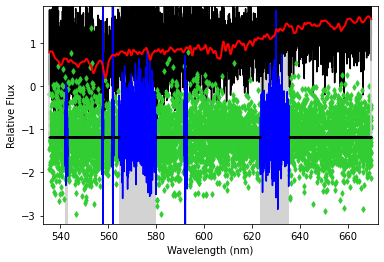

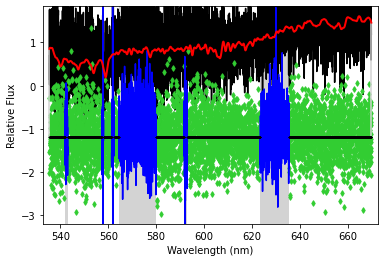

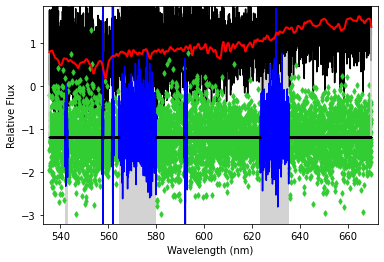

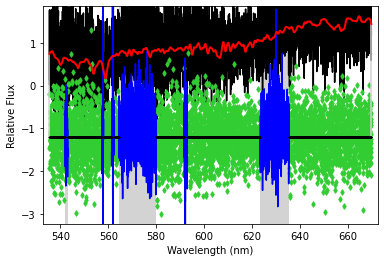

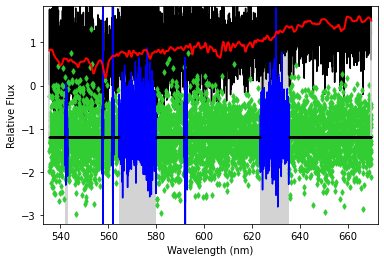

...

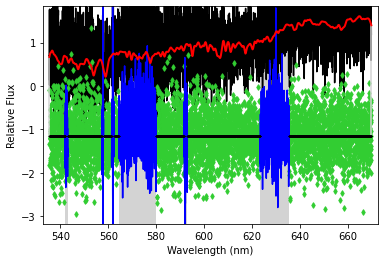

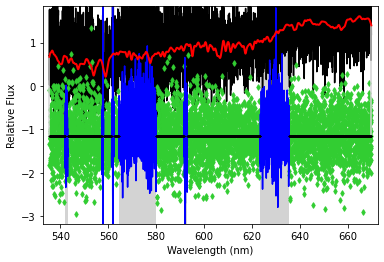

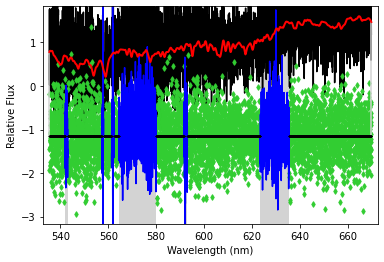

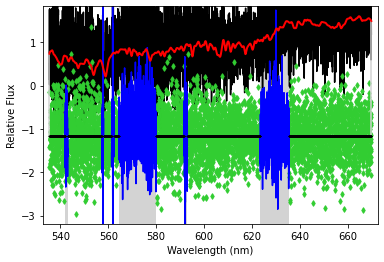

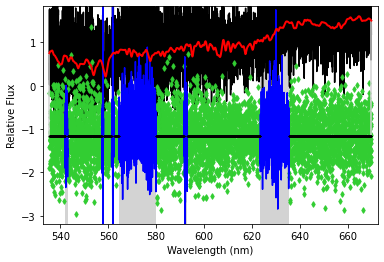

<Figure size 432x288 with 0 Axes>

In [86]:
spec_b.cal_veldis(temp_spec=tm_data, degree=[4, 15], mask_reg=mask_reg_b2, show_weight=True, moments=2)

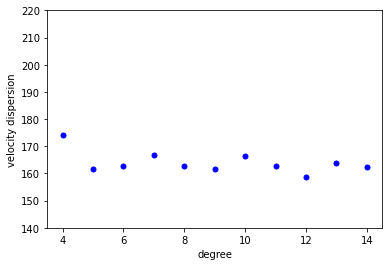

In [87]:
spec_b.plot_veldis(ylim=[140, 220])

order : 5


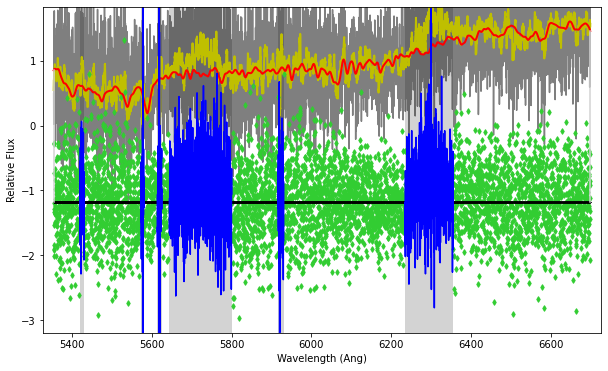

order : 8


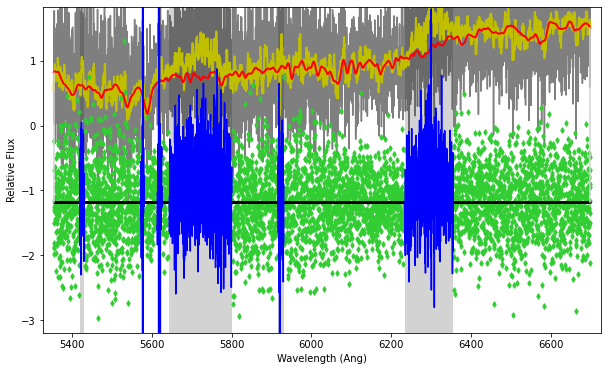

order : 10


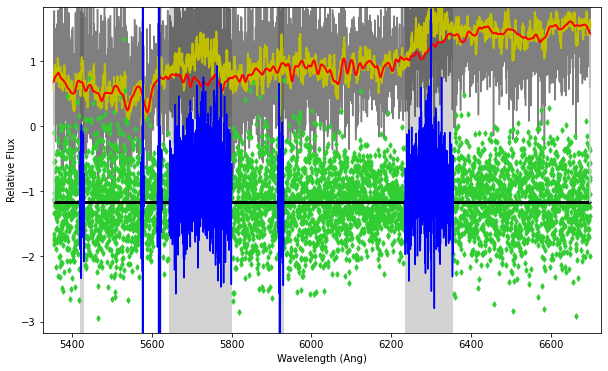

order : 12


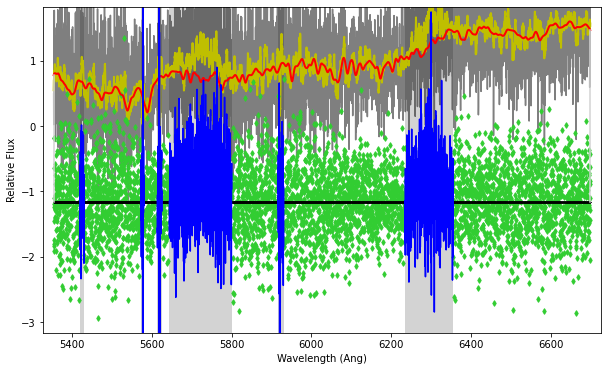

In [88]:
ord_list = np.array([5, 8, 10, 12])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec_b.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [89]:
mask_reg_b3 = np.log(np.array([(5420, 5430), (5573, 5580), (5614, 5625), (5644, 5800), 
                             (5916, 5930),
                             (6801, 6809)]))
print(mask_reg_b3)

[[8.59785109 8.59969441]
 [8.62568879 8.62694406]
 [8.63301876 8.63497623]
 [8.63834831 8.6656132 ]
 [8.68541582 8.68777949]
 [8.82482494 8.82600055]]



degree : 4
 Best Fit:       Vel     sigma
 comp.  0:    102576       189
chi2/DOF: 3.068; degree = 4; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 4
linear_method = lsq_box; Nonzero Templates (>0.1%):  14 / 1272

degree : 5
 Best Fit:       Vel     sigma
 comp.  0:    102583       181
chi2/DOF: 3.065; degree = 5; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 6
 Best Fit:       Vel     sigma
 comp.  0:    102582       181
chi2/DOF: 3.064; degree = 6; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 4
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 7
 Best Fit:       Vel     sigma
 comp.  0:    102581       188
chi2/DOF: 3.060; degree = 7; mdegree = 0
method = capfit; Jac calls: 3; Func calls: 11; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    102

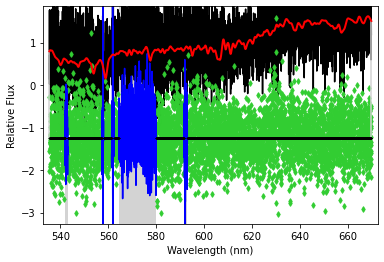

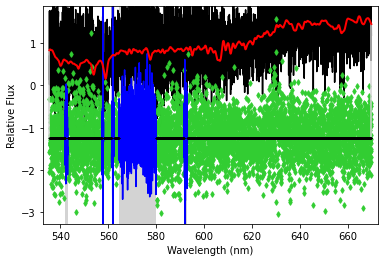

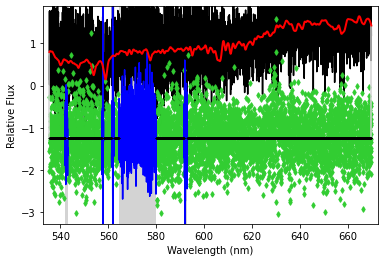

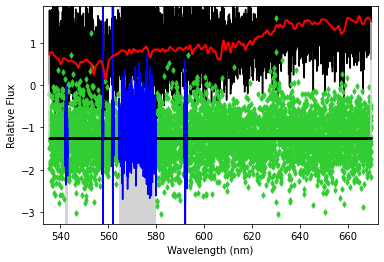

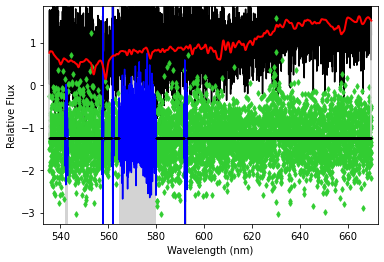

...

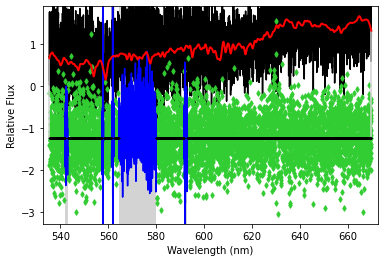

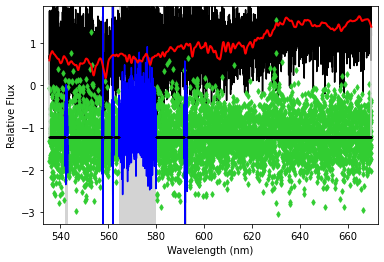

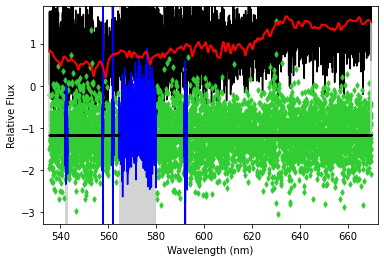

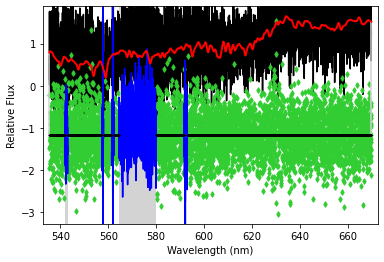

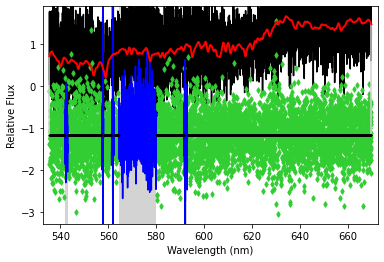

<Figure size 432x288 with 0 Axes>

In [90]:
spec_b.cal_veldis(temp_spec=tm_data, degree=[4, 15], mask_reg=mask_reg_b3, show_weight=True, moments=2)

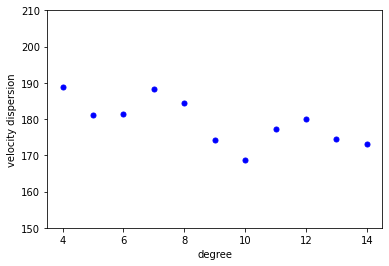

In [92]:
spec_b.plot_veldis(ylim=[150, 210])

order : 5


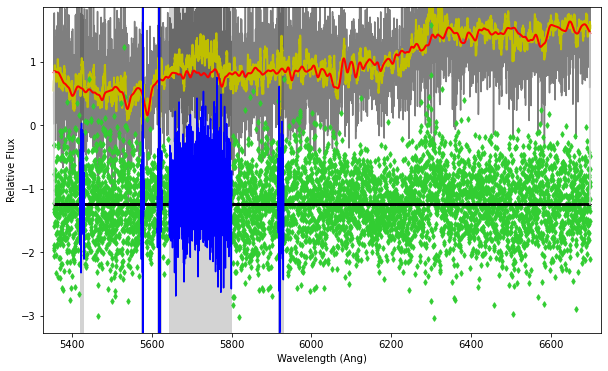

order : 8


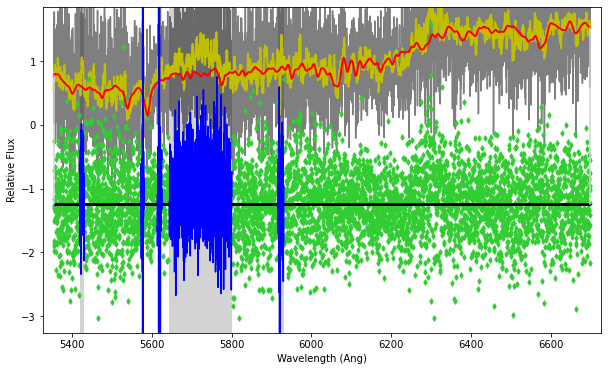

order : 10


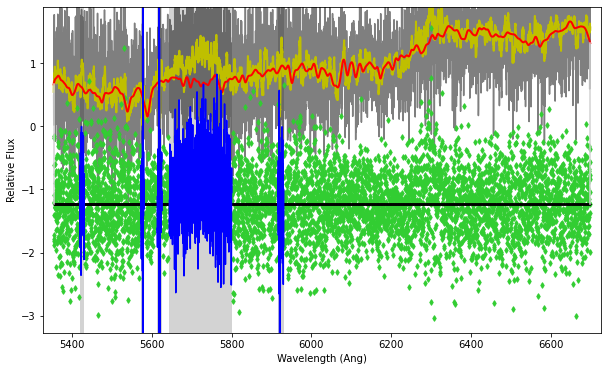

order : 12


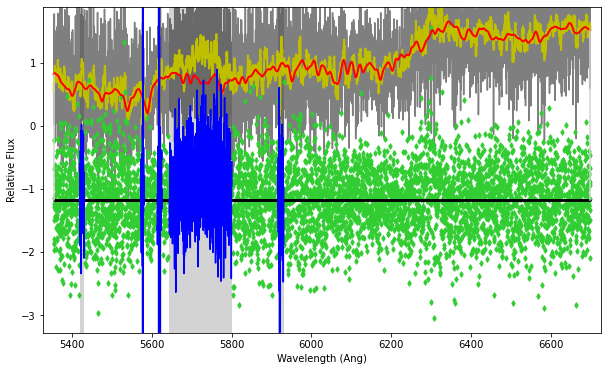

In [93]:
ord_list = np.array([5, 8, 10, 12])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec_b.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

## Red side 

In [64]:
spec_r = Veldis('../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits', 
              informat='fits', logwav=True, trimsec=[10200, 16000])


Reading spectrum from ../spectra_extraction/J1817_ESI_spectra/spec1d_J1817_coadd2d_moffat_deflector.fits
Expected file format: fits
 Spectrum Start:  6699.09
 Spectrum End:     8350.24
 Dispersion (1st pixel):   0.25
 Dispersion (average):      0.28




Line        lambda_rest  lambda_obs
----------  -----------  -----------
H-beta        4861.00       6844.29
Mg I (b)      5176.00       7287.81
Na I (D)      5889.95       8293.05
Na I (D)      5895.92       8301.46



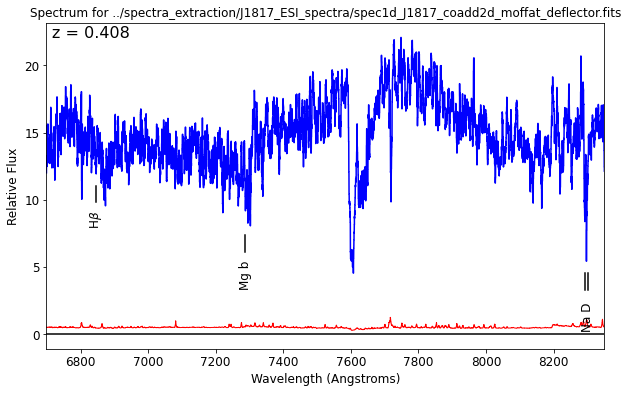

In [65]:
fg = plt.figure(figsize=(10,6))
spec_r.smooth(11, fig=fg)
spec_r.mark_lines('abs', z=0.408, usesmooth=True)

In [53]:
spec_r.closest_wavelength(wavrange=[[6900, 8978]])


Given waverange(assumed) : 

6900 8978

Closest waverange to the given ones : 

6900.054166043088 8978.028919707007


([(6900.054166043088, 8978.028919707007)], [(10978, 17907)])

Velocity scale = 11.389911 km/s


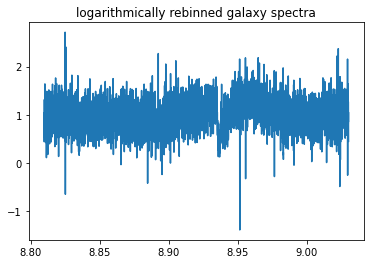

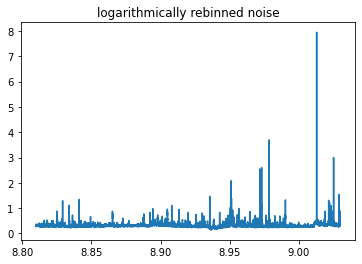

In [66]:
spec_r.cal_parm(z=0.408, high_z=False, logscale=True, veldis_start=350, noise_scale=0.3)

In [67]:
temp_sp = spec1d.Spec1d('../TEXT/100006.txt')
spec_r.gen_sigma_diff(wav_temp=temp_sp['wav'], sig_ins=0.85)


Reading spectrum from ../TEXT/100006.txt
Expected file format: text
 Spectrum Start:  3465.00
 Spectrum End:     9469.00
 Dispersion (1st pixel):   0.40
 Dispersion (average):      0.40


As no 'fwhm_temp' value is provided, FWHM for the Indo-US template library will be used as default value
vsyst = -197640.679478 

sigma_diff : 1.569009


1.5690089689323143

In [74]:
mask_reg_r1 = np.log(np.array([(7585, 7785)])) #(7306, 7334), (7957, 7968), (8191, 8214), (8278, 8286)
print(mask_reg_r1)

[[8.93392789 8.95995408]]



degree : 4
 Best Fit:       Vel     sigma
 comp.  0:    102745       616
chi2/DOF: 0.7647; degree = 4; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 5
 Best Fit:       Vel     sigma
 comp.  0:    102746       557
chi2/DOF: 0.7612; degree = 5; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  11 / 1272

degree : 6
 Best Fit:       Vel     sigma
 comp.  0:    102751       553
chi2/DOF: 0.7611; degree = 6; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  10 / 1272

degree : 7
 Best Fit:       Vel     sigma
 comp.  0:    102754       554
chi2/DOF: 0.7611; degree = 7; mdegree = 0
method = capfit; Jac calls: 4; Func calls: 14; Status: 2
linear_method = lsq_box; Nonzero Templates (>0.1%):  9 / 1272

degree : 8
 Best Fit:       Vel     sigma
 comp.  0:    

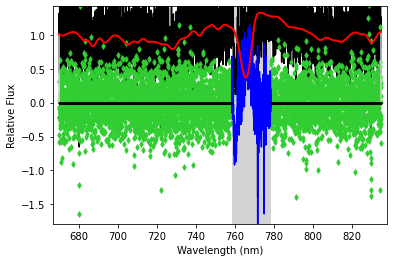

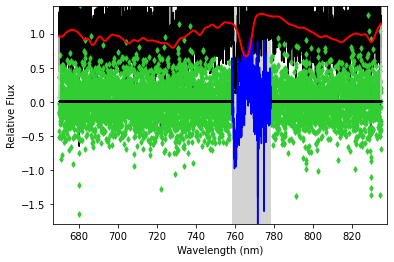

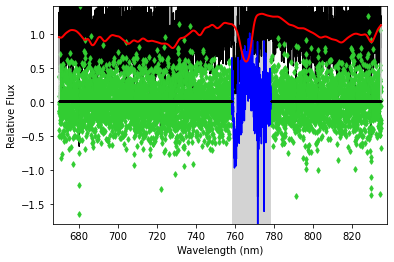

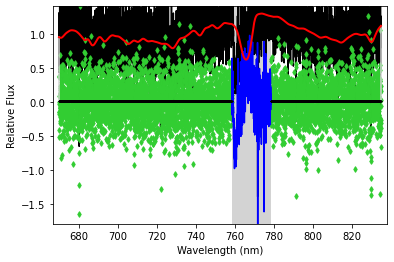

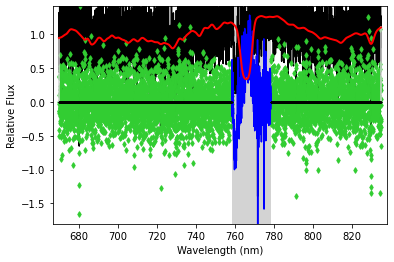

...

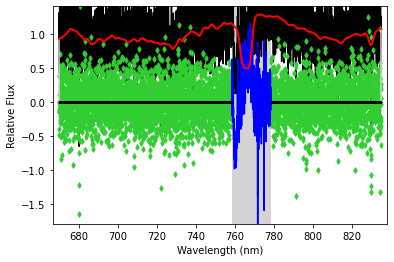

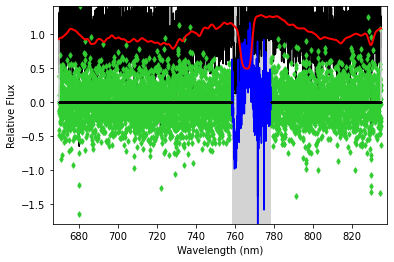

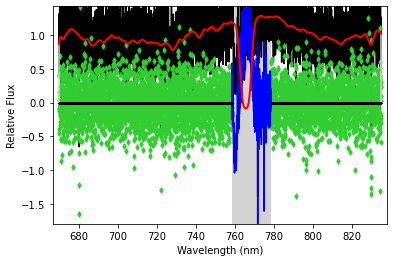

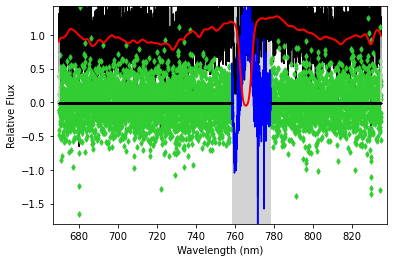

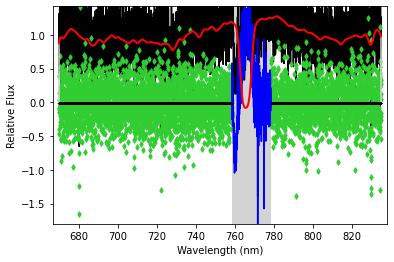

<Figure size 432x288 with 0 Axes>

In [75]:
spec_r.cal_veldis(temp_spec=tm_data, degree=[4, 15], mask_reg=mask_reg_r1, show_weight=True, moments=2)

order : 5


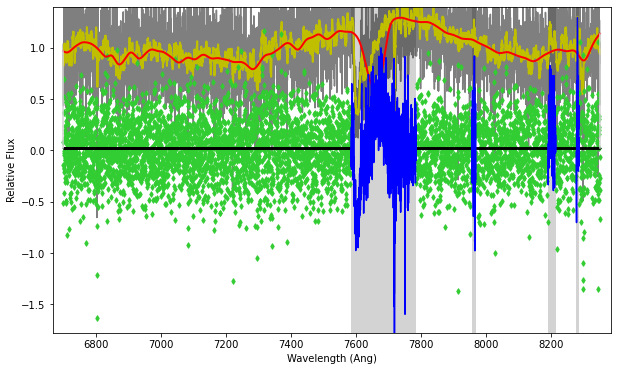

order : 8


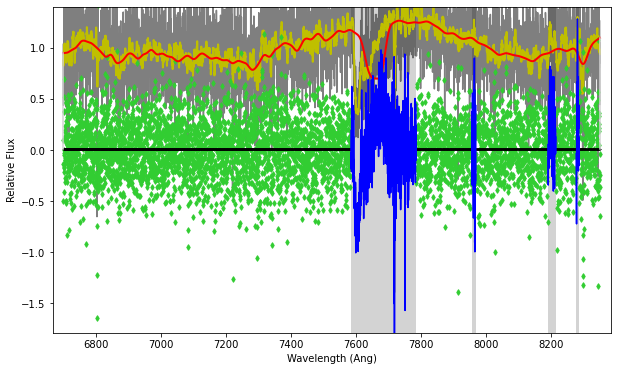

order : 10


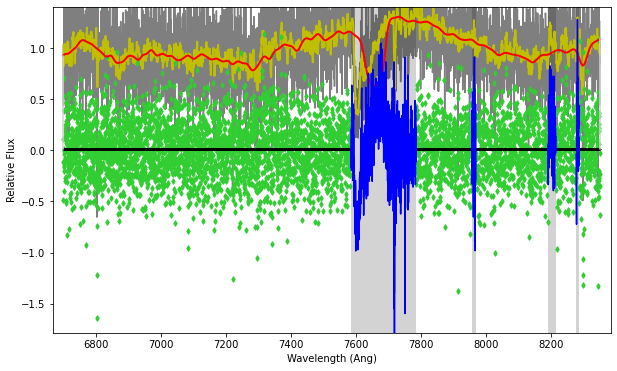

order : 12


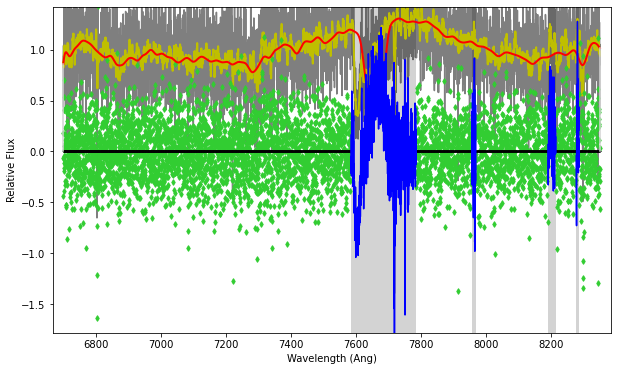

In [73]:
ord_list = np.array([5, 8, 10, 12])

for od in ord_list:
    fg = plt.figure(figsize=(10,6))
    spec_r.plot_fit(order=od, boxsize=15, fig=fg)
    print('order : %d' %od)
    plt.show()

In [76]:
spec1.cal_sis_veldis(0.9, 0.408, 3.07)


velocity dispersion assuming SIS mass profile is 203.432198


<Quantity 203.43219825>